# Tutorial on linear dynamical systems

In this notebook, we'll go over examples of different linear dynamical systems.

In [1]:
#!/usr/bin/python

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
import ssm
from ssm import util
import LDS
%matplotlib notebook
%load_ext autoreload
%autoreload 2

In [48]:
# enable relative imports
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import plotting_util
import tutorial_util

## Generate synthetic data
First, we generate states and observation from a linear dynamical system with gaussian noise. The dynamical system has the form:

\begin{equation}
\vec{x}_{t+1} = A\vec{x}_t + \vec{\omega}, \text{where}~\vec{\omega} \sim N(0,Q)
\end{equation}

With observations:

\begin{equation}
\vec{y}_{t} = C\vec{x}_t + \vec{\eta}, \text{where}~\vec{\eta} \sim N(0,R)
\end{equation}

The initial state $\vec{x}_0$ also comes from a gaussian distribution $N(\pi_0,V_0)$. 

Fill in the function `glds_generate_states_and_observations` below. Fill in the code to generate new latent states and observations. A few useful numpy functions:

- [np.matmul(A,b)](https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.dot.html): matrix multiplication between A and b, i.e. $A\vec{b}$
- [np.random.multivariate_normal($\mu$, $\Sigma$)](https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.dot.html): generate a sample $\vec{\omega} \sim N(\mu,\Sigma)$

In [98]:
def glds_generate_states_and_observations(A, C, Q, R, pi_0, V_0, num_timesteps):
    """ Generates a sequence of states and observations from a gaussian linear dynamical system.

    Args:
        A (np.matrix): Dynamics matrix (d_latent, d_latent)
        Q (np.matrix): State noise covariance (d_latent, d_latent)
        C (np.matrix): Observation matrix (d_observation, d_latent)
        R (np.matrix): Observation noise covariance (d_observation, d_observation)
        pi_0 (np.array): Initial state mean (d_latent, )
        V_0 (np.matrix): Initial state covariance (d_latent, d_latent)
        num_timesteps (int, optional): number of iterations for EM

    Returns:
        X (np.ndarray): (num_timesteps, d_latent) time-series of states
        Y (np.ndarray): (num_timesteps, d_observations) time-series of observations
    """
    np.random.seed(0) # for consistency
    assert A.shape[0] == A.shape[1], "Dynamics matrix must be square"
    assert Q.shape[0] == Q.shape[1], "State noise covariance must be square"
    assert C.shape[1] == A.shape[1], "Number of columns in observation matrix must match d_latent "
    assert R.shape[0] == R.shape[1], "Observation noise covariance must be square"
    
    d_latent = A.shape[0]
    d_observation = C.shape[0]

    X = [] # list of states 
    Y = [] # list of observations
    
    state_noise_mean = np.zeros((d_latent,))
    observation_noise_mean = np.zeros((d_observation,))
    
    # generate initial state and observation
    x = np.random.multivariate_normal(pi_0, V_0)
    y = C.dot(x) + np.random.multivariate_normal(observation_noise_mean, R)
    
    # add x and y to their respective lists
    X.append(x)
    Y.append(y)
    
    for _ in range(1, num_timesteps):
        """TODO: your code goes here! Fill in the formulas for x and y."""
    
        x = 0
        y = 0
        
        """End your code"""
        X.append(x)
        Y.append(y)
    
    X = np.array(X)
    Y = np.array(Y)
    
    return X, Y

In [99]:
# run this to test your implementation
tutorial_util.test_implementation(glds_generate_states_and_observations)

Try again! The shape of both your X and Y look wrong -- they should be (200, 2) and (200, 3)


In [47]:
# parameters of the gLDS
d_latent = 2
d_observation = 3
A = .99* util.random_rotation(d_latent) # dynamics matrix, a slowly decaying rotation
C = np.random.rand(d_observation,d_latent) # observation matrix, random

Q = np.diag(np.random.rand(d_latent,)) # state noise covariance
R = np.diag(np.random.rand(d_observation,)) # observation noise covariance


pi_0 = np.zeros((d_latent,)) # initial state mean
V_0 = Q # initial state covariance

In [ ]:
print(A, C, Q, R, pi_0, )

In [45]:
num_timesteps = 200
X, Y = glds_generate_states_and_observations(A, C, Q, R, pi_0, V_0, num_timesteps)

Note: We constrain each of the noise covariance matrices ($Q, R,$ and $V_0$) to be diagonal. This is not a restriction of the model, it just resolves a degenaracy. See [Roweis and Ghahramani 1996](http://mlg.eng.cam.ac.uk/pub/pdf/RowGha99a.pdf) for more information.

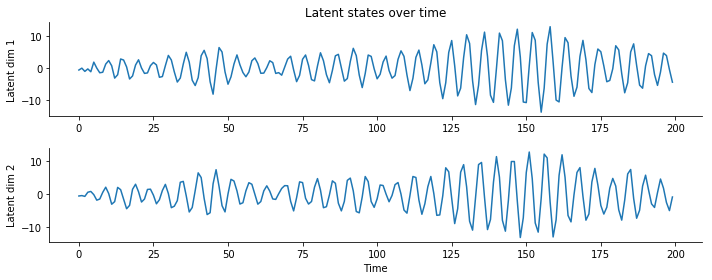

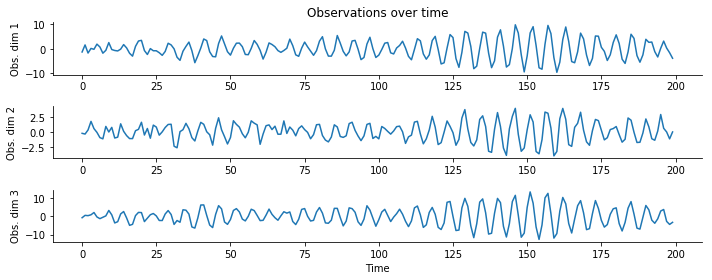

In [43]:
fig, ax = plt.subplots(d_latent, 1, figsize= (10,4),sharex=True)
ax[0].set_title("Latent states over time")
for i in range(d_latent):
    ax[i].plot(X[:,i])
    ax[i].set_ylabel('Latent dim {}'.format(i + 1))

ax[-1].set_xlabel('Time')
plotting_util.remove_frame(ax)
plt.tight_layout()
fig, ax = plt.subplots(d_observation, 1, figsize= (10,4),sharex=True)
ax[0].set_title("Observations over time")
for i in range(d_observation):
    ax[i].plot(Y[:,i])
    ax[i].set_ylabel('Obs. dim {}'.format(i + 1))
ax[-1].set_xlabel('Time')
plotting_util.remove_frame(ax)
plt.tight_layout()

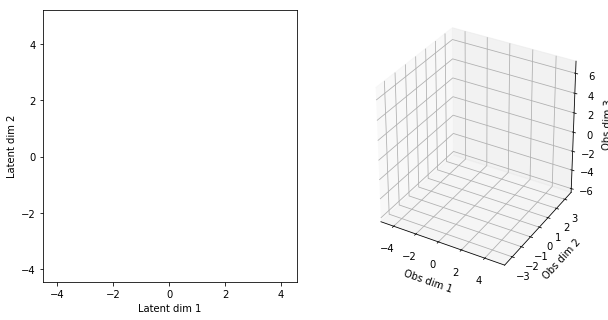

In [12]:
from mpl_toolkits.mplot3d import Axes3D

anim = plotting_util.scatter_animation_2D_and_3D(X, Y)
HTML(anim.to_jshtml())

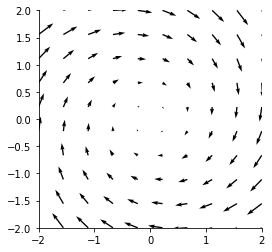

In [13]:
theta = np.pi/6 # angle of rotation in radians
rotation_matrix = np.matrix([[np.cos(theta), np.sin(theta)],
                   [-np.sin(theta),np.cos(theta)]])
plotting_util.plot_vector_field(rotation_matrix)

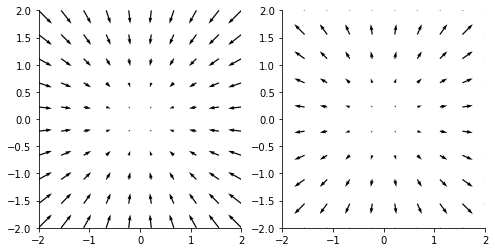

In [14]:
collapsing_dynamics = np.matrix([[.9, 0],
                                [0,.9]])
expanding_dynamics = np.matrix([[1.1, 0],
                               [0,1.1]])
plotting_util.plot_vector_field(collapsing_dynamics, expanding_dynamics)

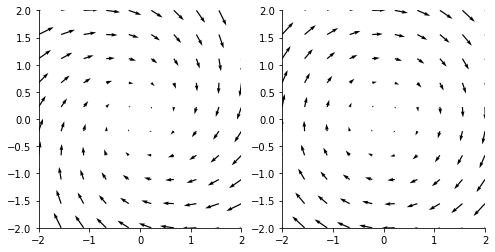

In [15]:
rotating_collapse = collapsing_dynamics.dot(rotation_matrix)
rotating_expand = expanding_dynamics.dot(rotation_matrix)
plotting_util.plot_vector_field(rotating_collapse, rotating_expand)

# Fitting Linear Dynamical Systems

Now we'll see a simple example of fitting a linear dynamical system. We'll start with a toy example using the observations that we generated above, and learn the parameters just from these observations.

The actual fitting work is happening in the LDS.py module. When we want to fit a dynamical system to a set of observations, we call the module's fit() function, which looks like this:

```python
for _ in range(num_iterations):
    A, C, Q, R, pi_0, V_0 = self._m_step(x_s, V_s, ...)
    x_s, V_s ... = self._e_step(y, A, C, Q, R, pi_0, V_0)

```

The fit function implements EM, which alternates between 2 steps:
    - E step (given current estimate of parameters, find most likely latent states)
    - M step (given current estimate of latent states, find most likely parameters)


In [18]:
model = LDS.gLDS() # instantiate gaussian linear dynamical systems module
x_hat, model_likelihood = model.fit(Y, d_latent, num_iterations=100)

In [19]:
true_likelihood = LDS.gLDS.get_likelihood(Y, A, C, Q, R, pi_0, V_0)

## Measures of fit

## model vs. true likelihood

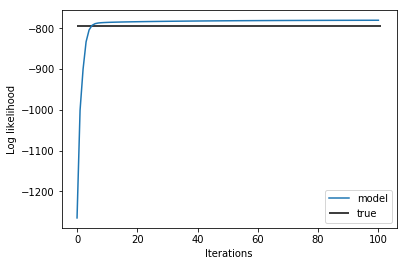

In [21]:
fig, ax = plt.subplots(1,1)
ax.hlines(true_likelihood, 0, len(model_likelihood), label='true')
ax.plot(model_likelihood, label='model')
ax.set_xlabel('Iterations')
ax.set_ylabel('Log likelihood')
ax.legend()

[[0.31551563 0.68650093]
 [0.83462567 0.01828828]
 [0.75014431 0.98886109]] [[1.21949008 0.03096104]
 [0.94622722 1.10668012]
 [1.99089212 0.29821665]]


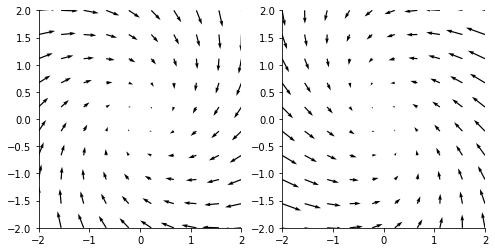

In [25]:

plotting_util.plot_vector_field(A, model.A)
print(C, model.C)

In [26]:
model.C.dot(model.A)

array([[-0.19337192, -1.07357441],
       [ 0.99768118, -0.27738967],
       [-0.05313609, -1.62557138]])

In [27]:
C.dot(A)

array([[-0.60659478,  0.43762635],
       [ 0.14166521,  0.81424594],
       [-0.81728353,  0.91758006]])

# PCA vs LDS

<IPython.core.display.Javascript object>


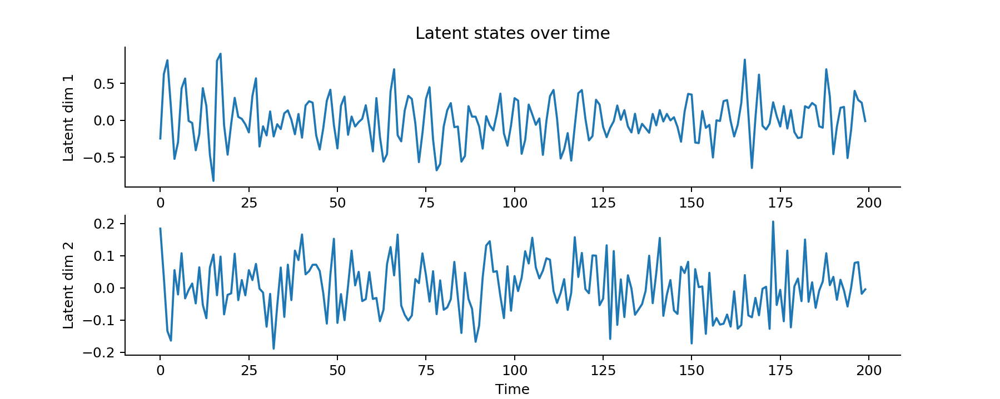

<IPython.core.display.Javascript object>


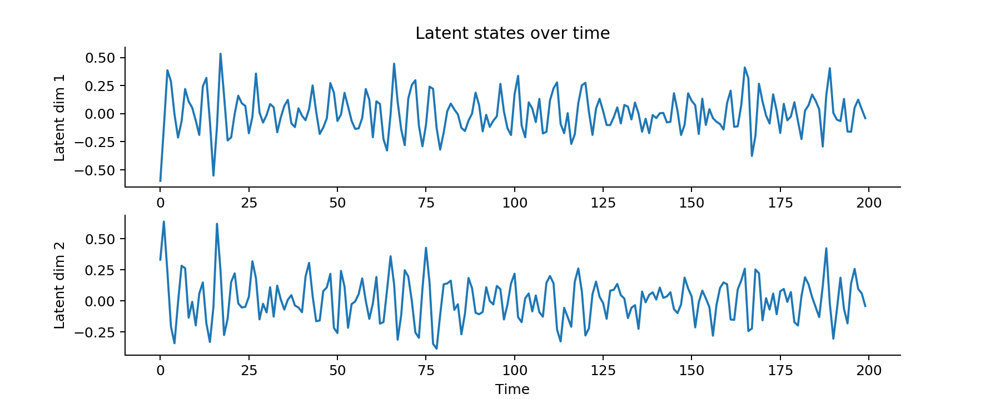

In [29]:
from sklearn.decomposition import PCA

pca = PCA()
X_hat_pca = pca.fit_transform(Y)
fig, ax = plt.subplots(d_latent, 1, figsize= (10,4),sharex=True)
ax[0].set_title("Latent states over time")
for i in range(d_latent):
    ax[i].plot(X_hat_pca[:,i])
    ax[i].set_ylabel('Latent dim {}'.format(i + 1))

ax[-1].set_xlabel('Time')
plotting_util.remove_frame(ax)

fig, ax = plt.subplots(d_latent, 1, figsize= (10,4),sharex=True)
ax[0].set_title("Latent states over time")
for i in range(d_latent):
    ax[i].plot(X[:,i])
    ax[i].set_ylabel('Latent dim {}'.format(i + 1))

ax[-1].set_xlabel('Time')
plotting_util.remove_frame(ax)

# fig, ax = plt.subplots(d_observation, 1, figsize= (10,4),sharex=True)
# ax[0].set_title("Observations over time")
# for i in range(d_observation):
#     ax[i].plot(Y[:,i])
#     ax[i].set_ylabel('Obs. dim {}'.format(i + 1))
# ax[-1].set_xlabel('Time')
# plotting_util.remove_frame(ax)

# plt.tight_layout()

## Fit LDS

In [142]:
model = gLDS()
x_hat, model_likelihood = model.fit(Y, d_latent, num_iterations=100)

NameError: name 'gLDS' is not defined

In [5]:
true_likelihood = gLDS.get_likelihood(Y, A, C, np.diag(Q), R, pi_0, V_0)

## Measures of fit

## model vs. true likelihood

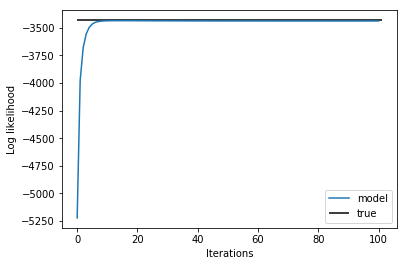

In [6]:
fig, ax = plt.subplots(1,1)
ax.hlines(true_likelihood, 0, len(model_likelihood), label='true')
ax.plot(model_likelihood, label='model')
ax.set_xlabel('Iterations')
ax.set_ylabel('Log likelihood')
ax.legend()

other metrics that will be included soon:
- error estimates for parameters (rotation + frobenius)
- verifying latents are the same post rotation
- comparing eigenvec/val between estimates and true params
- quantify noise reduction between estimates and true latents in terms of noise magnitude
- use poisson spikes generation, see how above convergence measures change